# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» хотят открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.



# Описание данных

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Файл moscow_places.csv


    


# Содержание

1. [Открытие данных](#start)
2. [Предобработка данных](#preprocessing)
    * [Изменение типов данных](#type)
    * [Обработка пропущенных значений](#null)
    * [Обработка дубликатов](#duplicates)
    * [Обработка аномальных данных](#anomalies)
    * [Создание столбца с названиями улиц](#street)
    * [Создание столбца 24/7](#worktime)
3. [Анализ данных](#analyse)
    * [Категории заведений](#category)
    * [Сетевые и не сетевые заыведения](#chain)
    * [Топ 15 популярных сетей Москвы ](#top15)
    * [Анализ заведений по округам](#district)
    * [Рейтинги заведений](#rating)
    * [Геоаналитика заведений Москвы](#geo)
4. [Выводы из анализа](#conclusion)
5. [Открытие кофейни: анализ идеи](#coffeehouse)
    * [Анализ количества](#quantity)
    * [Анализ расположения](#location)
    * [Анализ рейтинга](#rating_coffee)
    * [Прогноз цены одной чашки капучино](#cappuccino_price)
    * [Выводы](#coffeehouse_conclusion)
6. [Презентация](#presentation)

<a id='start'></a>
## Открытие данных

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from numpy import median
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import json
!pip install folium
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster

Defaulting to user installation because normal site-packages is not writeable


In [2]:
data = pd.read_csv ('C:/Users/олег/Desktop/Наталья/Data analyse/11. Визуализация данных/Проект/moscow_places.csv')
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Явно есть аномальные значения по средним чекам и по количеству мест в заведении.

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего представлено 8406 заведений общественного питания Москвы. 6 столбцов имеют тип float64 ( у некоторых из них можно поменять тип на float с меньшим количеством бит), 7 столбцов objet и только один int. 

- name — название заведения, тип данных object;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня», тип данных object;
- address — адрес заведения, тип данных object;
- district — административный район, в котором находится заведение, например Центральный административный округ, тип данных object;
- hours — информация о днях и часах работы, тип данных object;
- lat — широта географической точки, в которой находится заведение, тип данных float64;  
- lng — долгота географической точки, в которой находится заведение, тип данных float64;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0), тип данных float64 (можно изменить на float16);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее, тип данных object;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

    «Средний счёт: 1000–1500 ₽»;

    «Цена чашки капучино: 130–220 ₽»;

    «Цена бокала пива: 400–600 ₽».

и так далее, тип данных object;

- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    
    Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
   
    тип данных float64 (можно изменить на float16)
 
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    
    Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    
    тип данных float64 (можно изменить на float16)
    
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки), тип данных int;
- seats — количество посадочных мест, тип данных тип данных float64 (можно изменить на float16 или int, если получится убрать пропуски).
    

<a id='preprocessing'></a>
## Предобработка данных

Зафиксируем количество строк в датафрейме до обработки

In [5]:
befor = len(data['name'])
befor


8406

<a id='type'></a>
### Изменение типов данных

In [6]:
data[['rating', 'middle_avg_bill',  'seats']] =(
 data[['rating', 'middle_avg_bill',  'seats']].astype('float16')
)
data['chain'] = data['chain'].astype('uint8')

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float16
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float16
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   uint8  
 13  seats              4795 non-null   float16
dtypes: float16(3), float64(3), object(7), uint8(1)
memory usage: 714.3+ KB


In [7]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.000000,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.500000,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.601562,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.000000,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.000000,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Поменяем формат отображения рейтинга

In [8]:
rating=[]
for i in data['rating']:
    i = float('{:.1f}'.format(i))
    rating.append(i)
data['rating'] = rating
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<a id='null'></a>
### Обработка пропущенных значений

In [9]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Поскольку пропуски в данных не помешают нашему исследованию, можно их оставить.

<a id='duplicates'></a>
### Обработка дубликатов

In [10]:
data['name'] = data['name'].str.lower()

In [11]:
data.duplicated().sum()

0

Посмотрим неявные дубликаты по совпадению адреса и названия.

In [12]:
data[['name', 'address']].duplicated().sum()

3

Три дубликата. Удалим их.

In [13]:
data = data[data[['name', 'address']].duplicated()!=True]
len(data['name'])

8403

<a id='anomalies'></a>
### Обработка аномальных данных

__Посмотрим на распределение данных в middle_avg_bill, middle_coffee_cup и seats. Остальные данные либо формата object, либо  исходя из описания (describe) не вызывают беспокойства.__

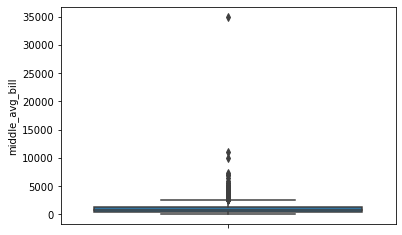

In [14]:

ax = sns.boxplot(y='middle_avg_bill', data=data) 

Посчитаем, сколько процентов данных мы удалим, если оставим только данные со средним чеком меньше 2000р

In [15]:
data1 = data.query('middle_avg_bill < 2000')
print(round((len(data['middle_avg_bill']) - len(data1['middle_avg_bill']))/len(data['middle_avg_bill'])*100, 1), "%")

66.3 %


Много, с учётом того, что будут ещё аномалии по количеству мест и чеку за чашку каппучино

Попробуем сначала посмотреть, что за заведение со средним чеком в 35000р

In [16]:
data.query('middle_avg_bill > 32000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35008.0,NaN,0,100.0


По данным координат, там нет никаких заведений общепита, только онко центр им. Блохина. Думаю, что это аномалия.

In [17]:
data = data.drop(index=[7177])


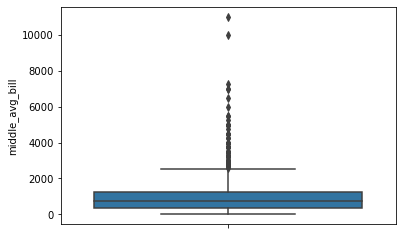

In [18]:
ax = sns.boxplot(y='middle_avg_bill', data=data) 

Поличным ощущениям, и по графику выше, кажется что 5000р больше похоже на границу аномалий. Посчитаем, сколько процентов данных мы удалим, если оставим только данные со средним чеком меньше 5000р

In [19]:
data.query('middle_avg_bill < 5000')
print(round((len(data['middle_avg_bill']) - len(data.query('middle_avg_bill < 5000')['middle_avg_bill']))/len(data['middle_avg_bill'])*100, 1), "%")

62.7 %


Предварительно посмотрим на них

In [20]:
data.query('middle_avg_bill > 5000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
2795,крошка картошка,быстрое питание,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,NaN,1,NaN
3038,беллини,ресторан,"Москва, Рублёвское шоссе, 28",Западный административный округ,"ежедневно, 12:00–00:00",55.747632,37.425631,4.3,высокие,Средний счёт:5000–5500 ₽,5248.0,NaN,0,150.0
3396,марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0
3487,800°с contemporary steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75.0
3518,чайка,ресторан,"Москва, Краснопресненская набережная, 12А",Центральный административный округ,"ежедневно, 12:00–00:00",55.752857,37.556365,4.8,высокие,Средний счёт:5000–8000 ₽,6500.0,NaN,1,250.0
3603,lucky izakaya bar,"бар,паб","Москва, Калашный переулок, 9",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.757313,37.599581,4.8,высокие,Средний счёт:5500 ₽,5500.0,NaN,0,NaN
3882,white rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7248.0,NaN,0,150.0
3910,кантинетта антинори,ресторан,"Москва, Денежный переулок, 20",Центральный административный округ,"ежедневно, 12:00–00:00",55.745383,37.586595,4.7,высокие,Средний счёт:6000 ₽,6000.0,NaN,0,80.0
5481,гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN


Из  всего списка аномальными (после проверки в интернете) кажутся только Чойхона (730) и крошка картошка(2795). Только их удалим, остальные оставим.

In [21]:
data = data.drop(index=[730, 2795])


Данные по количеству мест мы не используем в исследовании, поэтому их трогать не буду.

In [22]:
after  = len(data['name'])
print('Доля удалённых данных: ', round(((befor-after)/befor*100),2), '%')

Доля удалённых данных:  0.07 %


<a id='street'></a>
### Создание столбца с названиями улиц

Для того, чтобы вычленитить название улицы из адреса воспользуемся методом str.split. В качестве разделителя укажем запятую, и возьмём второй элемент из получившихся (индекс 1)

In [23]:
data['street'] = data['address'].str.split(pat=",",expand=True)[1]

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


<a id='worktime'></a>
### Создание столбца 24/7

Сначала посмотрим каким образом в столбце hours обозначается круглосуточная работа заведенияи

In [24]:
data.head(40)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица


Если заведение работает круглосуточно, то в столбце hours указывается ежедневно, круглосуточно.

In [25]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [26]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


<a id='analyse'></a>
## Анализ данных

<a id='category'></a>
### Категории заведений

__Посмотрим, какие категории заведений представлены в данных и количество заведений по категориям.__

In [27]:

print('Количество категорий:', data['category'].nunique(),'    ','Категории:' , data['category'].unique())

Количество категорий: 8      Категории: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


Итак, мы имеем 8 категорий:

- кафе
- ресторан
- кофейня
- пиццерия
- бар,паб
- быстрое питание
- булочная
- столовая

Посмотрим количество заведений по категориям

In [28]:
data1 = data.pivot_table( index = 'category', values = 'name', aggfunc='count')\
.sort_values(by= 'name',ascending= False).reset_index()


In [29]:
fig = px.bar(data1, x='category', y='name', title='Распределение количества заведений по категориям')
fig.update_layout(xaxis_title='Категория заведения',
                   yaxis_title='Количество заведений')
fig.show()


In [30]:
fig = go.Figure(data=[go.Pie(labels=data1['category'], values=data1['name'],\
                             title='Соотношение категорий заведений')])
fig.show() 

__Посмотрим количество мест в заведении в зависимости от категории.__

In [31]:
data_seats = data.pivot_table( index = 'category', values = 'seats', aggfunc='median')\
.sort_values(by= 'seats',ascending= False).reset_index() #медианное количество мест в заведении в зависимости от категории
data_seats

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [32]:
fig = px.bar(data_seats, x='category', y='seats',\
             title='Распределение количества мест в заведении по категориям')
fig.update_layout(xaxis_title='Категория заведения',
                   yaxis_title='Медианное количество мест')
fig.show()

Наибольшее количество мест в ресторанах, наименьшее в булочных. 

<a id='chain'></a>
### Сетевые и не сетевые заведения.

__Посчитаем количество сетевых и не сетевых заведений__

In [33]:
data_chain = data.pivot_table( index = 'chain', values = 'name', aggfunc='count')\
.sort_values(by= 'name',ascending= False).reset_index()
data_chain['chain'] = data_chain['chain'].map({0: 'не сетевые', 1: 'сетевые'}).astype('object')

In [34]:
data_chain

,chain,name
0,не сетевые,5198
1,сетевые,3202


In [35]:
fig = go.Figure(data=[go.Pie(labels=data_chain['chain'], values=data_chain['name'],\
                             title='Соотношение сетевых и не сетевых заведений')])
fig.show() 

Сетевых 3202 заведений, несетевых 5198

In [36]:
data_group=data.groupby(['category', 'chain'])[['name']].count().rename(columns={'name': 'count'}).reset_index()
#добавим проценты
data_group['ratio'] = (data_group['count']/data_group.groupby('category')['count'].transform('sum')).round(2)*100
data_group

,category,chain,count,ratio
0,"бар,паб",0,595,78.0
1,"бар,паб",1,168,22.0
2,булочная,0,99,39.0
3,булочная,1,157,61.0
4,быстрое питание,0,371,62.0
5,быстрое питание,1,231,38.0
6,кафе,0,1598,67.0
7,кафе,1,779,33.0
8,кофейня,0,693,49.0
9,кофейня,1,720,51.0


Чтобы на графике отображались не 1 и 0, заменим 1 на -сетевые, 0 - не сетевые

In [37]:
data_group['chain'] = data_group['chain'].map({0: 'не сетевые', 1: 'сетевые'}).astype('object')
data_group

,category,chain,count,ratio
0,"бар,паб",не сетевые,595,78.0
1,"бар,паб",сетевые,168,22.0
2,булочная,не сетевые,99,39.0
3,булочная,сетевые,157,61.0
4,быстрое питание,не сетевые,371,62.0
5,быстрое питание,сетевые,231,38.0
6,кафе,не сетевые,1598,67.0
7,кафе,сетевые,779,33.0
8,кофейня,не сетевые,693,49.0
9,кофейня,сетевые,720,51.0


In [38]:
fig = px.bar(data_group, x='category', y='ratio', color = 'chain',\
             title='Распределение сетевых и не сетевых заведений по категориям, %')
fig.update_layout(xaxis_title='Категория заведений',
                   yaxis_title='Доля заведений, %')
fig.show()

Наиболее характерно распространение сетевых заведений среди кофеен, пиццерий и булочных.

<a id='top15'></a>
### Топ 15 популярных сетей Москвы

Предполагаем, что популярность в нашем случае измеряется в количестве заведений у сети.

In [39]:
#отберём только сетевые заведения, сохраним в отдельную переменную и будем с ней дальше работать.
#data_chain = data.query('chain == 1')

In [40]:
#выведем топ 15 сетевых заведений
data_chain_15 = data.query('chain == 1').groupby('name')[['name']].count().rename(columns={'name': 'count'}).\
sort_values(by = 'count', ascending = False).head(15).reset_index()
data_chain_15

,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [41]:
fig = px.bar(data_chain_15, x='name', y='count',\
             title='Топ 15 сетевых заведений Москвы')
fig.update_layout(xaxis_title='Название',
                   yaxis_title='Количество заведений в сети')
fig.show()

Все имена в топ 15 знакомы. По-моему их объединяет уровень среднего чека - он средний или ниже среднего.

__Отфильтруем исходный датафрейм выбрав только заведения с названиями из топ 15.__

In [42]:
#создадим список из названий
list15 = data_chain_15['name'].rename('15')

In [43]:
#отфильтруем исходный датафрейм
data15 = data.loc[data['name'].isin(list15)]
data15.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False
23,буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False
32,додо пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,Коровинское шоссе,False
34,домино'с пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,Клязьминская улица,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False


In [44]:
#сгруппируем по имени и категории и построим график
data15_category = data15.groupby('category')[['name']].count().rename(columns={'name': 'count'})\
.sort_values(by='count', ascending=False).reset_index()

In [45]:
fig = go.Figure(data=[go.Pie(labels=data15_category['category'], values=data15_category['count'],\
                             title='Распределение заведений из списка топ 15 по категориям  ')])
fig.show() 

Наибольшее количество заведений из 15 наиболее популярных относятся к кофейням, на втором месте рестораны и на третьем пиццерии


__Рассмотрим распределение заведений топ 15 по административным округам__

In [46]:
data15_district = data15.groupby('district')['name'].count().reset_index().sort_values(by = 'name', ascending= False)

In [47]:
fig = go.Figure(data=[go.Pie(labels=data15_district['district'], values=data15_district['name'],\
                             title='Распределение заведений из списка топ 15 по административным округам')])
fig.show()

Больше всего популярных заведений сосредоточились в Центральном административном округе 26,4% , далее примерно одинаковое распределение 10,5-11%  между Южным, Северным, Западным и Северо-Восточным. Меньше всего 5,68 в Северо-Западном округе.

__Теперь рассмотрим распределение заведений топ 15 по административным округам и категориям одновременно__

In [48]:
data15_district_category =data15.groupby(['district', 'category'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)

data_ratio = data15.groupby(['district', 'category'])\
                         .size()\
                         .groupby(level=0)\
                         .apply(lambda x: round(100 * x / float(x.sum()), 2))\
                         .reset_index()\
                         .rename(columns={0:'ratio'})
data15_district_category = pd.merge(data15_district_category, data_ratio, how='left', on=['district', 'category'])
data15_district_category

,district,category,name,ratio
0,Центральный административный округ,кофейня,95,44.19
1,Центральный административный округ,ресторан,59,27.44
2,Центральный административный округ,кафе,47,21.86
3,Западный административный округ,кофейня,41,46.59
4,Северный административный округ,кофейня,40,45.45
5,Северо-Восточный административный округ,кофейня,37,43.53
6,Южный административный округ,кофейня,34,38.20
7,Восточный административный округ,кофейня,30,37.04
8,Южный административный округ,ресторан,28,31.46
9,Юго-Западный административный округ,кофейня,25,35.71


In [49]:
fig = px.bar(data15_district_category, x='district', y='name', color = 'category',\
             title='Количество заведений каждой категории по районам')
fig.update_layout(xaxis_title='Административный округ',
                   yaxis_title='Количество заведений',  xaxis={'categoryorder':'total descending'})
fig.show()

In [50]:
fig = px.bar(data15_district_category, x='district', y='ratio', color = 'category',\
             title='Доля заведений каждой категории по районам')
fig.update_layout(xaxis_title='Административный округ',
                   yaxis_title='Доля заведений')
fig.show()

Кофейни лидирую в топ 15 сетевых заведениях почти в каждом округе, кроме Юго-Восточного - там популярны пиццерии.

<a id='district'></a>
### Анализ заведений по округам

__Административные округа Москвы, присутствующие в датасете.__

In [51]:
print('Округа города Москвы: ', data['district'].unique(), '  Количество округов: ', data['district'].nunique())

Округа города Москвы:  ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']   Количество округов:  9


__Посмотрим общее количество заведений по округам__

In [52]:
data_district = data.groupby('district')[['name']].count().rename(columns={'name': 'count'})\
.sort_values(by = 'count', ascending = False).reset_index()

In [53]:
fig = go.Figure(data=[go.Pie(labels=data_district['district'], values=data_district['count'],\
                             title='Распределение заведений по административным округам')])
fig.show()

Больше всего заведений сосредоточились в Центральном административном округе 26,6% , далее примерно одинаковое распределение 10,5-10,7% между Южным, Северо-Восточным и  Северным. Меньше всего 4,92 в Северо-Западном округе.

__Теперь рассмотрим распределение заведений по административным округам и категориям одновременно__

In [54]:
data_district_category = data.groupby(['district', 'category'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)

In [55]:
fig = px.bar(data_district_category, x='name', y='district', color = 'category',\
             title='Количество заведений каждой категории по районам')
fig.update_layout(xaxis_title='Административный округ',
                   yaxis_title='Количество заведений заведений', yaxis=dict(autorange="reversed"))
fig.show()

Лучше будет построить график долей категорий в каждом административном округе

In [56]:
data_district_category = data.groupby(['district', 'category'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)
data_ratio = data.groupby(['district', 'category'])\
                         .size()\
                         .groupby(level=0)\
                         .apply(lambda x: round(100 * x / float(x.sum()), 2))\
                         .reset_index()\
                         .rename(columns={0:'ratio'})
data_district_category = pd.merge(data_district_category, data_ratio, how='left', on=['district', 'category'])
data_district_category.head(10)

,district,category,name,ratio
0,Центральный административный округ,ресторан,670,29.88
1,Центральный административный округ,кафе,464,20.70
2,Центральный административный округ,кофейня,428,19.09
3,Центральный административный округ,"бар,паб",364,16.24
4,Юго-Восточный административный округ,кафе,282,39.50
5,Восточный административный округ,кафе,272,34.13
6,Северо-Восточный административный округ,кафе,269,30.22
7,Южный административный округ,кафе,264,29.63
8,Западный административный округ,кафе,238,28.00
9,Юго-Западный административный округ,кафе,238,33.57


In [57]:
fig = px.bar(data_district_category, x='district', y='ratio', color = 'category',\
             title='Доля заведений каждой категории по районам')
fig.update_layout(xaxis_title='Административный округ',
                   yaxis_title='Доля заведений заведений,%')
fig.show()

Кафе лидируют во всех округах, кроме центрального. На втором месте рестораны или кофейни, в зависимости от округа. По распределению категорий центральны административный округ отличается от всех остальных. Во перввых на первом месте в нём рестораны, во вторых это единственный округ где такая большая доля баров и пабов. Развлекаться люди предпочитьают в центре Москвы)

Интересная разница в распределении по категориям между  "топ 15 сетевых" и всеми заведениями. В первом случае наибольшее количество наблюдается среди кофеен, во втором среди кафе.

<a id='rating'></a>
### Рейтинги заведений

__Посмотрим распределение рейтингов по категориям__

In [58]:
data_rating = data.groupby('category')[['rating']].agg('mean')\
                  .rename(columns={'rating': 'avg_rating'}).sort_values(by='avg_rating', ascending=False)\
                  .reset_index()

data_rating

,category,avg_rating
0,"бар,паб",4.387680
1,пиццерия,4.301264
2,ресторан,4.290495
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123896
7,быстрое питание,4.050332


In [59]:
fig = px.bar(data_rating, x='category', y='avg_rating',\
             title='Распределение рейтинга по категориям заведений')
fig.update_layout(xaxis_title='Категория',
                   yaxis_title='Средний рейтинг', yaxis_range=[4,4.5])
fig.show()

Средние рейтинги совсем мало отличаются. Минимальный 4,05, максимальный 4,39.

Самый высокий средний рейтинг у баров\пабов, как ни странно. Самый низкий у быстрого питания -  что как раз вполне ожидаемо. 

<a id='geo'></a>
### Геоаналитика заведений Москвы

#### Фоновая картограмма средних рейтингов заведений по районам

In [60]:
data_rating_district = data.groupby('district')[['rating']].agg('mean')\
                  .rename(columns={'rating': 'avg_rating'}).sort_values(by='avg_rating', ascending=False)\
                  .reset_index()
data_rating_district


,district,avg_rating
0,Центральный административный округ,4.377520
1,Северный административный округ,4.239644
2,Северо-Западный административный округ,4.208802
3,Южный административный округ,4.184512
4,Западный административный округ,4.181647
5,Восточный административный округ,4.174404
6,Юго-Западный административный округ,4.172920
7,Северо-Восточный административный округ,4.147978
8,Юго-Восточный административный округ,4.101120


In [72]:
!pip install geojson
import geojson
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:/Users/олег/Desktop/Наталья/Data analyse/11. Визуализация данных/Проект/admin_level_geomap.geojson'
with open(state_geo, encoding='utf-8') as f:
    gj = geojson.load(f)

Defaulting to user installation because normal site-packages is not writeable


In [73]:
from folium import Map, Marker, Choropleth # импортируем карту, маркер и хороплет
from folium.plugins import MarkerCluster # импортируем кластер
import json # импорт модуля json

In [75]:
# загружаем JSON-файл с границами округов Москвы
#state_geo = 'C:/Users/олег/Desktop/Наталья/Data analyse/11. Визуализация данных/Проект/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rating_district,
    columns=['district', 'avg_rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Средний рейтинг по районам отличается мало между собой. Однако есть тенденции увеличения рейтинга ближе к центру. Самый высокий средний рейтинг в Центральном административном округе 4,4, самый низкий в  Северо-Восточном и Юго-Восточном административных округах 4,19

#### Заведения на карте в виде кластеров

In [76]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


data.apply(create_clusters, axis=1)

m

#### Топ 15 улиц с наибольшим количеством заведений

In [63]:
data15_street = data.groupby('street')[['name']].count().rename(columns={'name': 'count'}).\
sort_values(by = 'count', ascending = False).reset_index()
data15_street.head(15)

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,87
6,Варшавское шоссе,76
7,Каширское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


__График распределения количества заведений и их категорий по топ15 улицам__

In [64]:
list15 = data15_street['street'].head(15).rename('15')
data_street = data.loc[data['street'].isin(list15)]
data_street.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
12,заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,МКАД,False
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
26,пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False
28,mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False


In [65]:
#сгруппируем данные по улицам и категориям 
data_street_category = data_street.groupby(['street','category'])[['name']].count().reset_index()\
.rename(columns= {'name': 'count'}).sort_values(by='count', ascending=False)
data_street_category

,street,category,count
93,проспект Мира,кафе,53
63,МКАД,кафе,45
96,проспект Мира,ресторан,45
94,проспект Мира,кофейня,36
70,Профсоюзная улица,кафе,35
...,...,...,...
58,Люблинская улица,пиццерия,1
83,проспект Вернадского,булочная,1
23,Кутузовский проспект,булочная,1
66,МКАД,столовая,1


In [66]:
fig = px.bar(data_street_category, x='street', y='count', color = 'category',\
             title='Распределение количества заведений каждой категории по топ 15 улицам')
fig.update_layout(xaxis_title='Улица',
                   yaxis_title='Количество заведений', xaxis={'categoryorder':'total descending'})
fig.show()

Наибольшее количество заведений находится на улице "Проспект мира". Наиболее встречающиеся из них категории по мере убывания:

- кафе
- рестораны
- кофейни

#### Улицы только с одним заведениме общепита

In [67]:
place1_streets = list(data[data['street'].isin(data['street'].value_counts()[data['street']\
                    .value_counts() == 1].index)]['street'].unique())
print('Количество улиц с одним заведением общепита: ', len(place1_streets))

Количество улиц с одним заведением общепита:  458


Очень много улиц, оказывается, с одним заведением. 

Посмотрим в каких категория в основном находятся эти заведения.

In [68]:
data_place1_streets = data[data['street'].isin(place1_streets)]
data_place1_streets['category'].value_counts()


кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

Наибольшее количество заведений относится к кафе - 160 шт., на втором месте - 90 шт. рестораны и третье место 86 шт. у кофеен.

Теперь посмотрим распределение этих заведений по районам.

In [69]:
data_place1_streets['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

Большинство находится в Центральном административном округе. Видимо на очень маленьких, немного затерянных улочках) Именно в центре Москвы их очень много.

#### Анализ среднего чека по районам

In [70]:
data_bill_district = data.groupby('district')[['middle_avg_bill']].agg('mean')\
                  .sort_values(by='middle_avg_bill', ascending=False)\
                  .reset_index()
data_bill_district

,district,middle_avg_bill
0,Центральный административный округ,1191.0
1,Западный административный округ,1053.0
2,Северный административный округ,896.5
3,Северо-Западный административный округ,822.0
4,Восточный административный округ,802.5
5,Юго-Западный административный округ,792.5
6,Южный административный округ,725.0
7,Северо-Восточный административный округ,716.5
8,Юго-Восточный административный округ,654.0


In [78]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

# выводим карту
m

В центральном округе средний чек значительно выше. Чем дальше от центра тем средний чек ниже.

<a id='conclusion'></a>
## Выводы из анализа

Всего имеем 8 категорий заведений : кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная, столовая

Топ 3 категории по количеству заведений:
- кафе 28,3%
- ресторан 24,2%
- кофейня 16,8%

Наибольшее количество мест в ресторанах 86, наименьшее в булочных 50.

Сетевых 38%, не сетевых 62%. Наиболее распространённые категории для сетевых заведений:кофейни, пиццерии, булочные

Из топ 15 популярных сетевых заведений лидируют кофейни - 41%. 

Больше всего популярных сетевых заведений сосредоточились в Центральном административном округе 26,4% , далее примерно одинаковое распределение 10,5-11%  между Южным, Северным, Западным и Северо-Восточным. Меньше всего 5,68 в Северо-Западном округе.

Средние рейтинги заведений по категориям совсем мало отличаются. Минимальный 4,05, максимальный 4,39
Самый высокий средний рейтингбаров/пабов, самый низкий у быстрого питания.

Средний рейтинг заведений по округам также не сильно отличается. Максимальный в Центральном округе  -4,4, минимальный  в Юго-Восточном - 4,1

Улица "Проспект мира" лидирует по количеству заведений.
Наиболее встречающиеся из них категории по мере убывания: кафе, рестораны, кофейни

На 457 улицах Москвы встречается только по одному заведению, большинство из них в Центральном районе т.к. именно там сосредоточены самые короткие улицы.

Средний чек по районам варьируется от минимального 646р в Юго-Восточном административном округе  до 954р. в Центральном административном округе. 

__Расстояние от центра влияет на количество заведений,  величину среднего чека и рейтинг. С увеличением расстояния от центра значения всех этих величины уменьшаются.__

<a id='coffeehouse'></a>
## Открытие кофейни: анализ осуществимости идеи

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно.

Задача: провести анализ для открытия новой кофейни.

<a id='quantity'></a>
### Анализ количества заведений и времени работы

In [ ]:
#предварительно сыормируем датасет для анализа, оставив в начальном датафрейме только кофейни.
data_coffee = data[data['category']== 'кофейня']
data_coffee

In [ ]:
print('Количество кофеен в Москве: ', data_coffee['name'].count())

__Посмотрим количество кофеен, работающих круглосуточно__

In [ ]:
print('Количество круглосуточно работающих кофеен в Москве: ', \
      data_coffee[data_coffee['is_24/7']== True]['name'].count())

In [ ]:
data_coffee_hours = data_coffee.groupby('is_24/7')[['name']].count().reset_index()
data_coffee_hours['is_24/7'] = data_coffee_hours['is_24/7'].map({False: 'не круглосуточно', True: 'круглосуточно'})\
                                .astype('object')
fig = go.Figure(data=[go.Pie(labels=data_coffee_hours['is_24/7'], values=data_coffee_hours['name'],\
                             title='Соотношение круглосуточно и не круглосуточно работающих кофеен')])
fig.show() 

In [ ]:
data_coffee[data_coffee['is_24/7']== True]

Очевидно, что круглосуточных кофеен очень мало по сравнению с не круглосуточными. Практически все круглосуточно работающие кофейни сетевые. Многие из них находятся на автозаправочных станциях. 

Посмотрим их расположение на карте

In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера к первым 5 записям датафрейма
data_coffee[data_coffee['is_24/7']== True].apply(create_marker, axis=1)
    
# выводим карту
m

In [ ]:
data_coffee_hours = data_coffee[data_coffee['is_24/7']== True].groupby('district')[['name']].count().reset_index()


In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_hours,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество круглосуточных заведений типа кофейня',
).add_to(m)

# выводим карту
m

Большинство круглосуточно работающих кофеен сосредоточено ближе к центру Москвы

<a id='location'></a>
### Анализ расположения

Посмотрим распределение кофеен по районам

In [ ]:
data_coffee_district = data_coffee.groupby('district')[['name']].count().sort_values(by='name', ascending = False).reset_index()
data_coffee_district

Отобразим данные на карте

In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество заведений типа кофейня',
).add_to(m)

# выводим карту
m

Центральный округ в сильном отрыве от остальных районов - 428 заведений. Для сравнения в следующим за ним Северном округе 193 заведений. Разница больше чем в 2 раза.

<a id='rating_coffee'></a>
### Анализ рейтинга

Посчитатем средний рейтинг кофеен.

In [ ]:
print('Средний рейтин заведений типа кофейня ', data_coffee['rating'].mean().round(2))

Посмотрим распределение рейтинга по районам

In [ ]:
data_coffee_rating = data_coffee.groupby('district')[['rating']].mean().round(2).sort_values(by='rating', ascending = False).reset_index()
data_coffee_rating

In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

Средний рейтинг не сильно различается по округам. Самый высокий в Центральном - 4,34  и Северо-Западном 4,33 административном округах.

<a id='cappuccino_price'></a>
### Прогноз цены одной чашки капучино

Посчитаем среднюю стоимость чашки капучино по всем кофейням. Потом посмотрим распредедление цен по округам.

In [ ]:
print('Средняя цена чашки каппучино: ', data_coffee['middle_coffee_cup'].mean().round())

In [ ]:
data_coffee_bill = data_coffee.groupby('district')[['middle_coffee_cup']].mean().round()\
.sort_values(by = 'middle_coffee_cup', ascending = False).reset_index()
data_coffee_bill

In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино по округам',
).add_to(m)

# выводим карту
m

Ожидаемо, самая высокая стоимость чашки капучино в Западном округе - 190р., на втором месте Центральный административный округ - 188р.

Предлагаю за цену чашки капучино взять ориентир среднее значение по всем кофейням - 175р. Но финальная цена всё же должна также зависеть от места расположения кофейни. Т.к. если кофейня будет расположена например в Юго-Восточном округе, то цена чашки в 175 р. может показаться немного завышенной по сравнению с остальными заведениями. Что может быть критично для только  что открывшегося заведения.

<a id='coffeehouse_conclusion'></a>
### Выводы и рекомендации

Всего кофеен в Москве 1413. Из них только 4,3 % работают круглосуточно. 425 в Центральном округе.

Средний рейтинг 4,28. От округа к округу он не сильно отличается. Максимальный в Центральном административном округе - 4,34, минимальный 4,19 в Западном.

Средняя цена чашки капучино 175 рубля. Самая высокая стоимость в Западном административном округе 190р, самая низкая в Юго-Восточном 151рублей.

_Рекомендации:_

- Возможно имеет смысл рассмотреть открытие круглосуточной кофейни. Их очень мало, скорее всего конкуренция будет значительно ни же. Но место необходимо с высокой проходимостью круглосуточной. 

- Локация кофейни:  рассмотреть Западный административный округ. Там сейчас не так много кофеен 150 - так мы избегаем жёсткой конкуренции как например в Центральном. Во-вторых рейтинг в Западном округе меньше всего - хорошего уровня заведение будет выгодно отличаться от заведений с низким рейтингом. В третьих первое место средней стоимости чашки капучино в Западном округе позволит установить сразу среднюю цену чашки по Москве, в перспективе увеличить цену, когда кофейня наберёт популярность.

- Цену за чашку капучино установить среднюю по округу, в котором инвестор в итоге решит открыть кофейню.




<a id='presentation'></a>
## Презентация

Презентация: <https://drive.google.com/file/d/1t4M1Uw6V3VGP90juXJ3W_pUCirHsnlTe/view?usp=share_link>